# Data Challenge 

# Import

In [136]:
import numpy as np
import json
import os
import glob
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy.ndimage import convolve1d
from skimage import io, color, morphology, filters
from skimage.morphology import diamond,disk,square, remove_small_objects, remove_small_holes,opening,closing,dilation,erosion
from collections import defaultdict
from scipy.signal import find_peaks



# 1. Load and Convert Data

## First load 

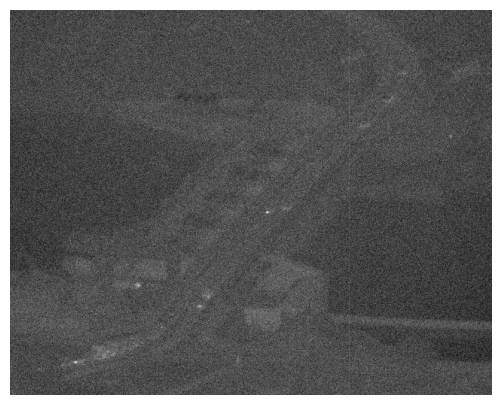

In [83]:
image=io.imread('images/frame_0000ld1.png')
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
axs.imshow(image, cmap='grey')
axs.axis('off')
plt.show()
# print(image)

## Test Simple Normalisation 
`image_8bit = (image_16bit - min) / (max - min) * 255`

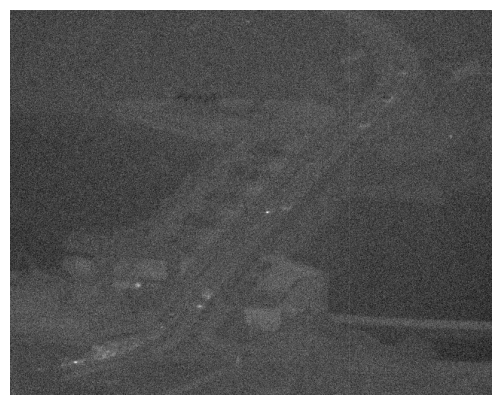

In [84]:
img_simple_n = (image - np.min(image)) / (np.max(image) - np.min(image)) * 255
img_simple_n = img_simple_n.astype(np.uint8)
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
axs.imshow(img_simple_n, cmap='grey')
axs.axis('off')
plt.show()

#### Comment 
It didn't visually changed anything, super !

## Test Contrast Limited Adaptive Histogram Equalization (CLAHE)

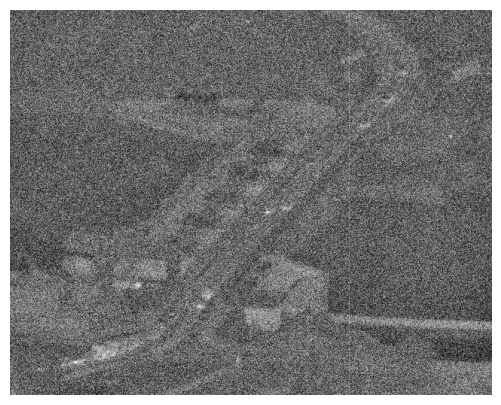

In [85]:
# Conversion nécessaire pour CLAHE (qui travaille en 8 bits)
img_8bit = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
img_clahe = clahe.apply(img_8bit)
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
axs.imshow(img_clahe, cmap='grey')
axs.axis('off')
plt.show()

#### Comment 
It is a bit better in the lightning but we cannot distinguish what is in the image. 

## Test Percentile method 

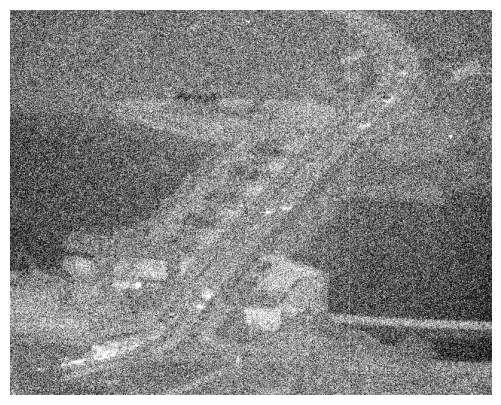

In [86]:
def convert_to_8_img(img_16bit):
    """""
    Convert 16 bits img into 8 bits using percentiles to not be biased by outliers  
    arg : img 
    return : converted img in 8 bits
    """""
    # 1. Utiliser des percentiles pour ignorer les pixels aberrants (très chauds ou très froids)
    # Cela permet de mieux voir les détails de la scène sans être ébloui par les extrêmes
    p2, p98 = np.percentile(img_16bit, (2, 98))
    img_clipped = np.clip(img_16bit, p2, p98)
    
    # 2. Normaliser entre 0 et 255
    img_8bit = ((img_clipped - p2) / (p98 - p2) * 255).astype(np.uint8)
    return img_8bit

img_percentile = convert_to_8_img(image)
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
axs.imshow(img_percentile, cmap='grey')
axs.axis('off')
plt.show()

#### Comment 
Lighting even better 

## Comparison of different methods 

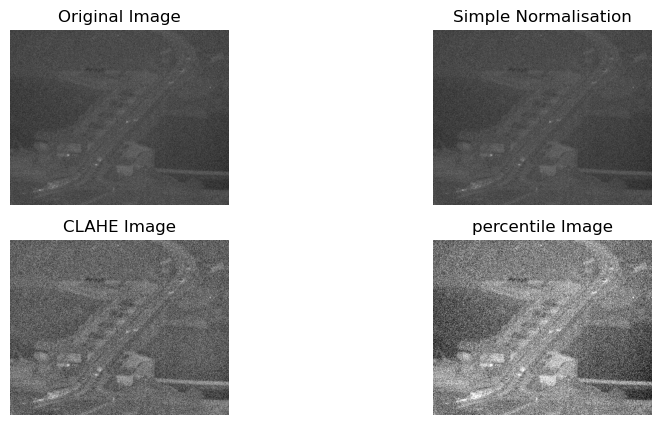

In [87]:
# plot images with both images 
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(10, 5))
axs = axs.flatten()
axs[0].imshow(image, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')
axs[1].imshow(img_simple_n, cmap='gray')
axs[1].set_title('Simple Normalisation')
axs[1].axis('off')
axs[2].imshow(img_clahe, cmap='gray')
axs[2].set_title('CLAHE Image')
axs[2].axis('off')
axs[3].imshow(img_percentile, cmap='gray')
axs[3].set_title('percentile Image')
axs[3].axis('off')
plt.show()

#### comments 
We can see that when we display with .imshow(), it is already normalasing it since the original looks the same as the Simple Normalisation one. 
The CLAHE is a bit better, and the Percentile image is the best one !

## Look at the different sub-sequences 

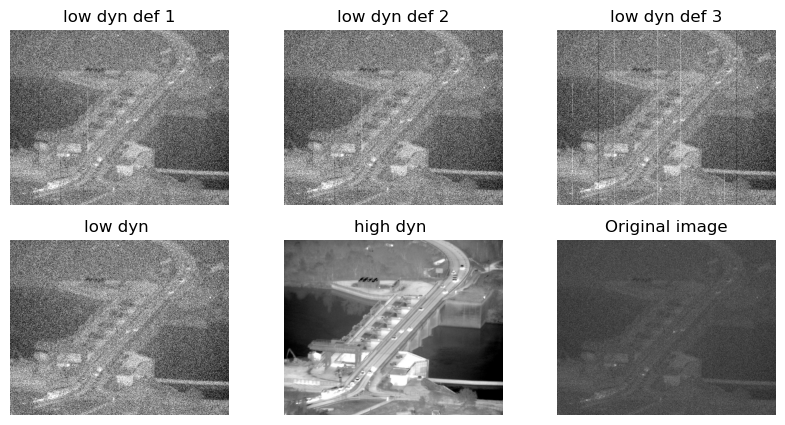

In [88]:
image_def1=convert_to_8_img(io.imread('images/frame_0000ld1.png'))
image_def2=convert_to_8_img(io.imread('images/frame_0000ld2.png'))
image_def3=convert_to_8_img (io.imread('images/frame_0000ld3.png'))
image_ld=convert_to_8_img (io.imread('images/frame_0000ld.png'))
image_hd=convert_to_8_img (io.imread('images/frame_0000.png'))


# plot images with both images 
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 3, figsize=(10, 5))
axs = axs.flatten()
axs[0].imshow(image_def2, cmap='gray')
axs[0].set_title('low dyn def 1')
axs[0].axis('off')
axs[1].imshow(image_def2, cmap='gray')
axs[1].set_title('low dyn def 2')
axs[1].axis('off')
axs[2].imshow(image_def3, cmap='gray')
axs[2].set_title('low dyn def 3')
axs[2].axis('off')
axs[3].imshow(image_ld, cmap='gray')
axs[3].set_title('low dyn ')
axs[3].axis('off')
axs[4].imshow(image_hd, cmap='gray')
axs[4].set_title('high dyn ')
axs[4].axis('off')
axs[5].imshow(image, cmap='gray')
axs[5].set_title('Original image')
axs[5].axis('off')
plt.show()

#### Comment
We can notice there are more defects on the defective 3 columns 

# 2. Detection 

## Test de Morphological techniques for pre-processing
### Closing and Opening 

(np.float64(-0.5), np.float64(639.5), np.float64(511.5), np.float64(-0.5))

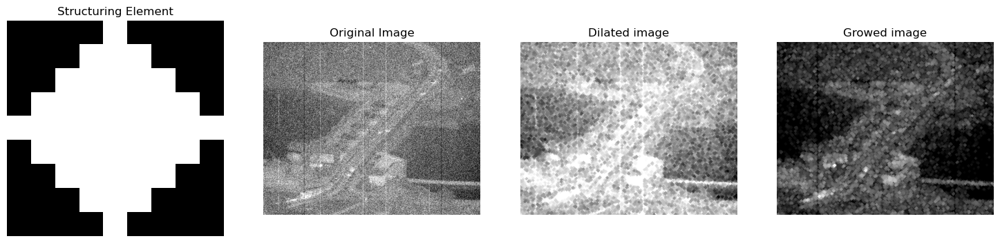

In [89]:
SE1 = morphology.diamond(4)
image_def3_dilated= morphology.closing(image_def3, SE1)

image_def3_growed= morphology.opening(image_def3, SE1)
# large_circles_2 = morphology.remove_small_holes(img_circle, area_threshold=50)


fig, ax = plt.subplots(1, 4, figsize=(15,5))
fig.tight_layout()
ax=ax.flatten()
ax[0].imshow(SE1, cmap='gray')
ax[0].set_title('Structuring Element')
ax[0].axis('off')


ax[1].imshow(image_def3, cmap='gray')
ax[1].set_title('Original Image')
ax[1].axis('off')

ax[2].imshow(image_def3_dilated, cmap='gray')
ax[2].set_title('Dilated image')
ax[2].axis('off')


ax[3].imshow(image_def3_growed, cmap='gray')
ax[3].set_title('Growed image')
ax[3].axis('off')


#### Comment 
The morphological operation did not just transform the defects, but everything in the image ...not sure it is gonna help

### Gradient 

(np.float64(-0.5), np.float64(639.5), np.float64(511.5), np.float64(-0.5))

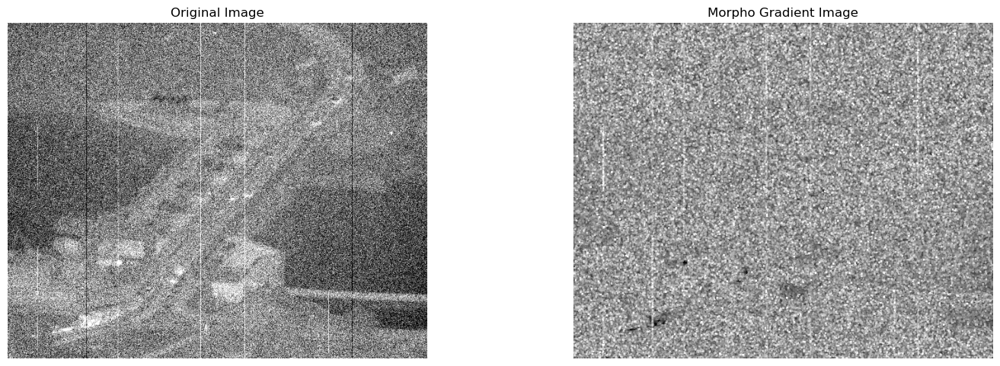

In [90]:
image_def3_grad = ndimage.morphological_gradient(image_def3, size=(3,3))

fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.tight_layout()
ax[0].imshow(image_def3, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow( image_def3_grad, cmap='gray')
ax[1].set_title('Morpho Gradient Image')
ax[1].axis('off')


### Comment 
Well ... not conclusive aswell

## Test Projection 1D 
### Global Tresholding 

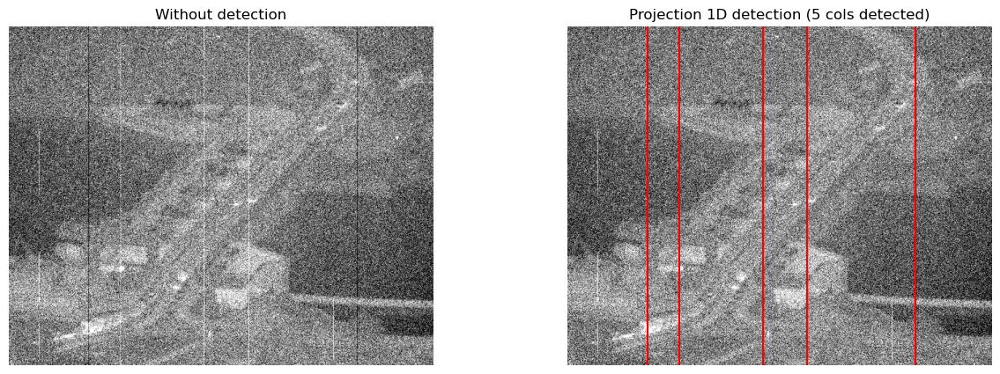

In [91]:
# axe 0 = lignes (de haut en bas)
# axe 1 = colonnes (de gauche à droite)

# On écrase l'image sur l'axe des lignes (axis=0) en utilisant la médiane.
# Le résultat est un vecteur 1D de la même longueur que la largeur de l'image.
projection_mediane = np.median(image_def3, axis=0)

# Calcul des stats de base
moyenne = np.mean(projection_mediane)
ecart_type = np.std(projection_mediane)

# Déf deux seuils
seuil_haut = moyenne + 3 * ecart_type
seuil_bas = moyenne - 3 * ecart_type

# Trouver les col qui dépassent en haut OU en bas
colonnes_defectueuses = np.where((projection_mediane > seuil_haut) | (projection_mediane < seuil_bas))[0]

###### VISUALISATION ###### 
fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Without detection')
ax[0].set_axis_off()

ax[1].imshow (convert_to_8_img(image_def3), cmap='gray')
for col in colonnes_defectueuses : 
    ax[1].axvline(col, color="red")
ax[1].set_title(f'Projection 1D detection ({len(colonnes_defectueuses)} cols detected)')
ax[1].set_axis_off()

#### Comment
We can see this method allow us to identify defects, but only the ones going from one edge of the image to the other. 
At the begining, it was detecting only the white columns, because we had only one threshold, detecting only the peack above this threshold (high intensity). With 2 thresholds, we are now detecting high and low intenist§y peaks.

However, the fragmented are not detected. 

### Plot to illustrate GT on the report

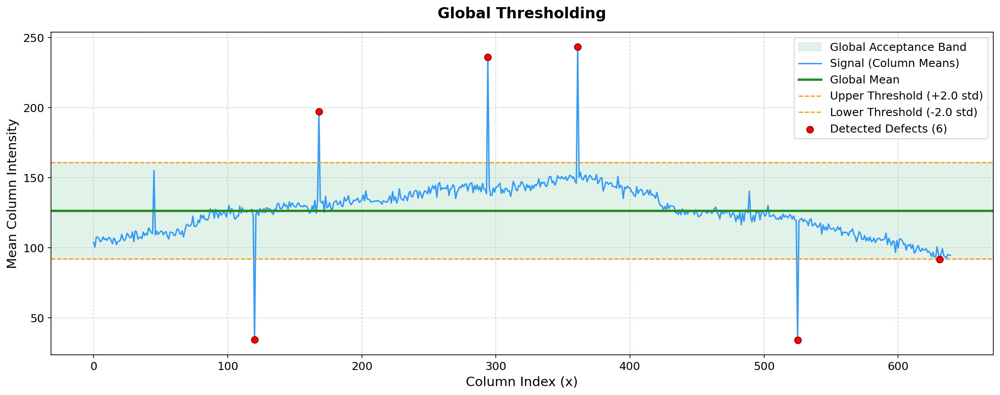

In [156]:

# Paramètre de tolérance 
std_factor_global = 2.0 

metric_ = np.mean(image_def3, axis=0)

global_mean = np.mean(metric_)
global_std = np.std(metric_)

seuil_haut_global = global_mean + (std_factor_global * global_std)
seuil_bas_global = global_mean - (std_factor_global * global_std)

colonnes_defectueuses_GT = np.where(
    (metric_ > seuil_haut_global) | (metric_ < seuil_bas_global)
)[0]

fig, ax = plt.subplots(figsize=(15, 6), dpi=150)

ax.axhspan(seuil_bas_global, seuil_haut_global, 
           color='mediumseagreen', alpha=0.15, label='Global Acceptance Band')

# Tracé du signal brut
ax.plot(metric_, label='Signal (Column Means)', color='dodgerblue', alpha=0.9, linewidth=1.5)

# Tracé de la moyenne globale (Ligne droite centrale)
ax.axhline(global_mean, label='Global Mean', color='forestgreen', linewidth=2.5)

# Tracé des limites de tolérance globales
ax.axhline(seuil_haut_global, label=f'Upper Threshold (+{std_factor_global} std)', color='darkorange', linestyle='--', linewidth=1.2)
ax.axhline(seuil_bas_global, label=f'Lower Threshold (-{std_factor_global} std)', color='darkorange', linestyle='--', linewidth=1.2)

# Tracé des défauts détectés
if len(colonnes_defectueuses_GT) > 0:
    ax.scatter(colonnes_defectueuses_GT, metric_[colonnes_defectueuses_GT], 
               color='red', edgecolor='darkred', s=50, label=f'Detected Defects ({len(colonnes_defectueuses_GT)})', zorder=5)

ax.set_title('Global Thresholding', fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Column Index (x)', fontsize=14)
ax.set_ylabel('Mean Column Intensity', fontsize=14)

ax.tick_params(axis='both', which='major', labelsize=12)

ax.legend(loc='upper right', fontsize=12, framealpha=0.9, edgecolor='lightgrey')
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [160]:
def local_threshold(image, window_size=50, std_factor=1.0):
    height = image.shape[0] # récup hauteur de l'image
    metric_ = np.mean(image, axis=0)
    
    smoothing_filter = np.ones(window_size) / window_size
    local_trend = convolve1d(metric_, smoothing_filter, mode='reflect')
    tolerance_margin = std_factor * np.std(metric_)
    
    defect_columns = np.where(np.abs(metric_ - local_trend) > tolerance_margin)[0]

    resultats = {}
    for col in defect_columns:
        resultats[int(col)] = [(0, height - 1)]

    return resultats

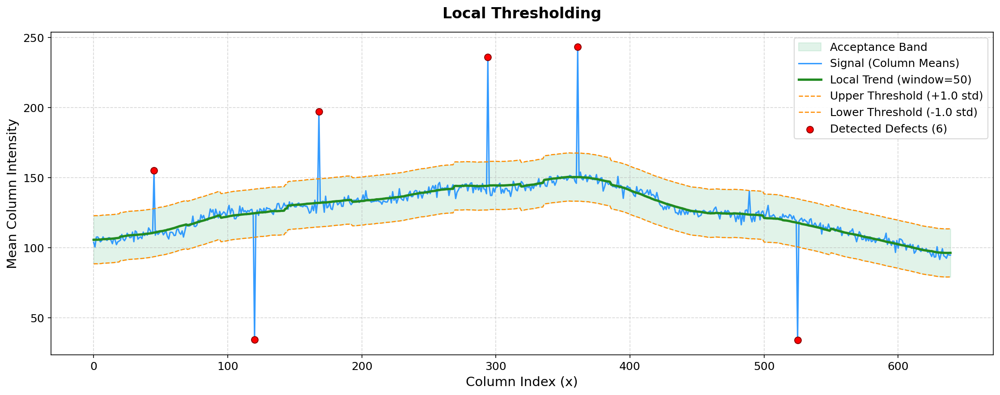

In [161]:
# params
window_size = 50
std_factor = 1.0

metric_ = np.mean(image_def3, axis=0)
smoothing_filter = np.ones(window_size) / window_size
local_trend = convolve1d(metric_, smoothing_filter, mode='reflect')
tolerance_margin = std_factor * np.std(metric_)

seuil_haut = local_trend + tolerance_margin
seuil_bas = local_trend - tolerance_margin

# Trouver les col qui dépassent en haut OU en bas
colonnes_defectueuses_LT = list(local_threshold(image_def3, window_size=50, std_factor=1.0).keys())

fig, ax = plt.subplots(figsize=(15, 6), dpi=150)

# NOUVEAUTÉ CLARTÉ : Remplissage de la zone de tolérance
ax.fill_between(range(len(metric_)), seuil_bas, seuil_haut, 
                color='mediumseagreen', alpha=0.15, label='Acceptance Band')

# Tracé du signal brut
ax.plot(metric_, label='Signal (Column Means)', color='dodgerblue', alpha=0.9, linewidth=1.5)

# Tracé de la tendance lissée
ax.plot(local_trend, label=f'Local Trend (window={window_size})', color='forestgreen', linewidth=2.5)

# Tracé des limites de tolérance
ax.plot(seuil_haut, label=f'Upper Threshold (+{std_factor} std)', color='darkorange', linestyle='--', linewidth=1.2)
ax.plot(seuil_bas, label=f'Lower Threshold (-{std_factor} std)', color='darkorange', linestyle='--', linewidth=1.2)

# Tracé des défauts 
ax.scatter(colonnes_defectueuses_LT, metric_[colonnes_defectueuses_LT], 
           color='red', edgecolor='darkred', s=50, label=f'Detected Defects ({len(colonnes_defectueuses_LT)})', zorder=5)

ax.set_title('Local Thresholding', fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Column Index (x)', fontsize=14)
ax.set_ylabel('Mean Column Intensity', fontsize=14)

ax.tick_params(axis='both', which='major', labelsize=12)

ax.legend(loc='upper right', fontsize=12, framealpha=0.9, edgecolor='lightgrey')
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()

plt.show()

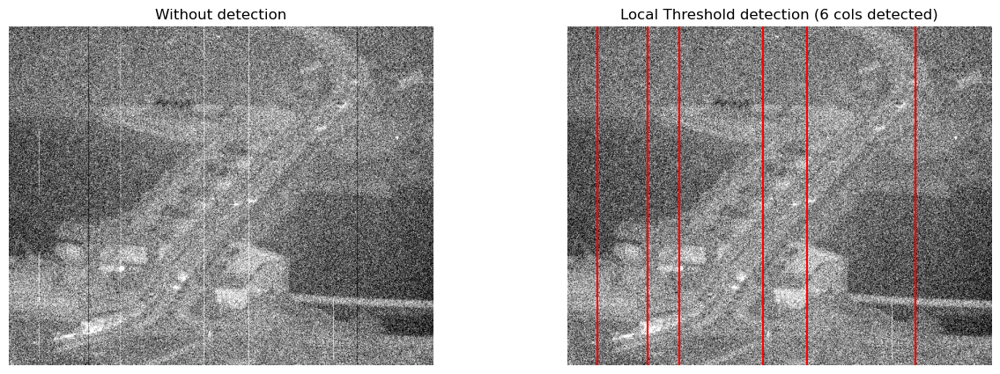

In [162]:

# Trouver les col qui dépassent en haut OU en bas
colonnes_defectueuses_LT = list(local_threshold(image_def3, window_size=50, std_factor=1.0).keys())

fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Without detection')
ax[0].set_axis_off()

ax[1].imshow (convert_to_8_img(image_def3), cmap='gray')
for col in colonnes_defectueuses_LT : 
    ax[1].axvline(col, color="red")
ax[1].set_title(f'Local Threshold detection ({len(colonnes_defectueuses_LT)} cols detected)')
ax[1].set_axis_off()

#### Comment 
Same performance 

## Test CFAR 1D 

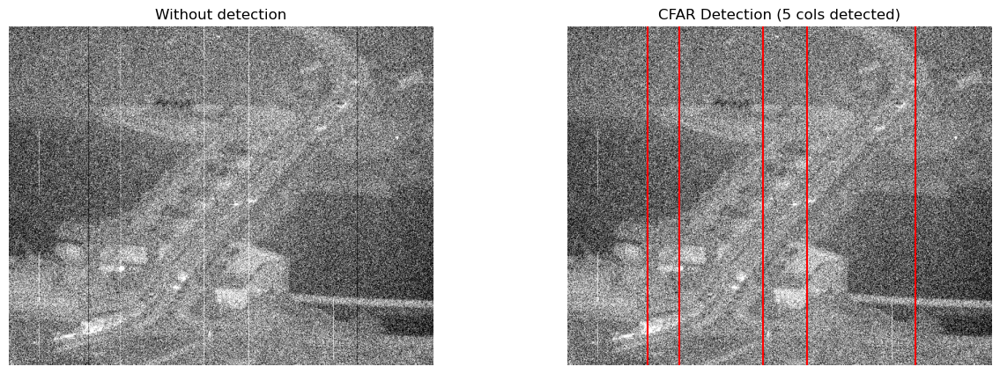

In [93]:
# on set les param du CFAR
num_train_side = 4  # 4 à gauche, 4 à droite (8 en tout)
num_guard_side = 2  # 2 à gauche, 2 à droite (4 en tout + le CUT au milieu)
alpha = 2.0 # Notre multiplicateur

# Création du masque "troué" (pour prendre en compte les guard cells)
taille_fenetre = (num_train_side * 2) + (num_guard_side * 2) + 1 # 1 pour prendre en compte la cell qu'on est en train de juger aussi 
noyau = np.zeros(taille_fenetre)

# On met des '1' dans les zones qu'on veut prendre en compte (sur les train cells)
noyau[:num_train_side] = 1.0  # partie gauche
noyau[-num_train_side:] = 1.0 # part droite

# On divise par le nombre total de cellules d'entraînement (et que les train cells pas les uatres) pour faire une vraie moyenne
nombre_train_total = num_train_side * 2
noyau = noyau / nombre_train_total 

# print(f"Notre noyau ressemble à ça : {noyau}")
# va ressembler à : [0.125 0.125 0.125 0.125 0. 0. 0. 0. 0. 0.125 0.125 0.125 0.125]

# Application de la convolution 
projection_mediane = np.median(image_def3, axis=0) # ca donne la mediane pour chaque col = donne vect 1D avec toutes medianes
bruit_de_fond_local = convolve1d(projection_mediane, noyau, mode='reflect') # donne ligne de base adaptative 

# calcul la tolérance pour detecter peak 
ecart_type = np.std(projection_mediane)
tolerance = 3 * ecart_type  # Le Alpha est ici remplacé par 3 sigmas 
                           # (mais du coup on prend pas la formule de l'article ?)

# couloir suit le paysage localement 
seuil_haut_cfar = bruit_de_fond_local + tolerance
seuil_bas_cfar = bruit_de_fond_local - tolerance

# Détection Finale 
colonnes_defectueuses_cfar = np.where(
    (projection_mediane > seuil_haut_cfar) | 
    (projection_mediane < seuil_bas_cfar)
)[0]

# print(f"Colonnes CFAR trouvées aux indices : {colonnes_defectueuses_cfar}")

####### VISUALISATION CFAR ######
fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Without detection')
ax[0].set_axis_off()
ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
for col in colonnes_defectueuses_cfar :
    ax[1].axvline(col, color="red")
ax[1].set_title(f'CFAR Detection ({len(colonnes_defectueuses_cfar)} cols detected)')
ax[1].set_axis_off()

#### Comment 
With this new technique, we obtain the same performance of detection. The fragmented columns are still abscent of the detection.

### CFAR_band

In [ ]:
import numpy as np
from scipy.ndimage import convolve1d
from collections import defaultdict

def detecter_cfar_par_bandes(image, hauteur_bande=60, train_cells=4, guard_cells=2):
    """
    Découpe l'image en bandes horizontales et applique le CFAR sur chaque bande
    pour détecter les fragments de défaut des colonnes
    """
    height, width = image.shape
    
    # Utilisation d'un defaultdict pour grouper automatiquement par clé (x)
    segments_trouves = defaultdict(list)
    
    # Params du CFAR 
    num_train_side = train_cells 
    num_guard_side = guard_cells  
    taille_fenetre = (num_train_side * 2) + (num_guard_side * 2) + 1 
    noyau = np.zeros(taille_fenetre)
    noyau[:num_train_side] = 1.0  
    noyau[-num_train_side:] = 1.0 
    noyau = noyau / (num_train_side * 2)

    # Decoup img en bandes
    # parcourt img de haut en bas -> saut de 'hauteur_bande' en 'hauteur_bande'
    for y_start in range(0, height, hauteur_bande):
        y_end = min(y_start + hauteur_bande, height) # min() pour pas déborder à la fin
        
        # extrait sous-img (bande horizontale)
        bande = image[y_start:y_end, :]
        
        # calcule projection médiane QUE sur cette bande
        projection_bande = np.median(bande, axis=0)
        
        # applique CFAR
        bruit_de_fond_local = convolve1d(projection_bande, noyau, mode='nearest')
        
        # Tolérance locale pour CETTE bande spécifique
        ecart_type_bande = np.std(projection_bande)
        tolerance = 3 * ecart_type_bande  
        
        seuil_haut = bruit_de_fond_local + tolerance
        seuil_bas = bruit_de_fond_local - tolerance
        
        # Détection pour CETTE bande
        colonnes_detectees = np.where(
            (projection_bande > seuil_haut) | 
            (projection_bande < seuil_bas)
        )[0]
        
        # Enregistre le résultat dans le dictionnaire
        for x in colonnes_detectees: 
            segments_trouves[int(x)].append((int(y_start), int(y_end)))

    # On convertit le defaultdict en dict classique avant de le renvoyer
    return dict(segments_trouves)

#### Varying train cells parameters 

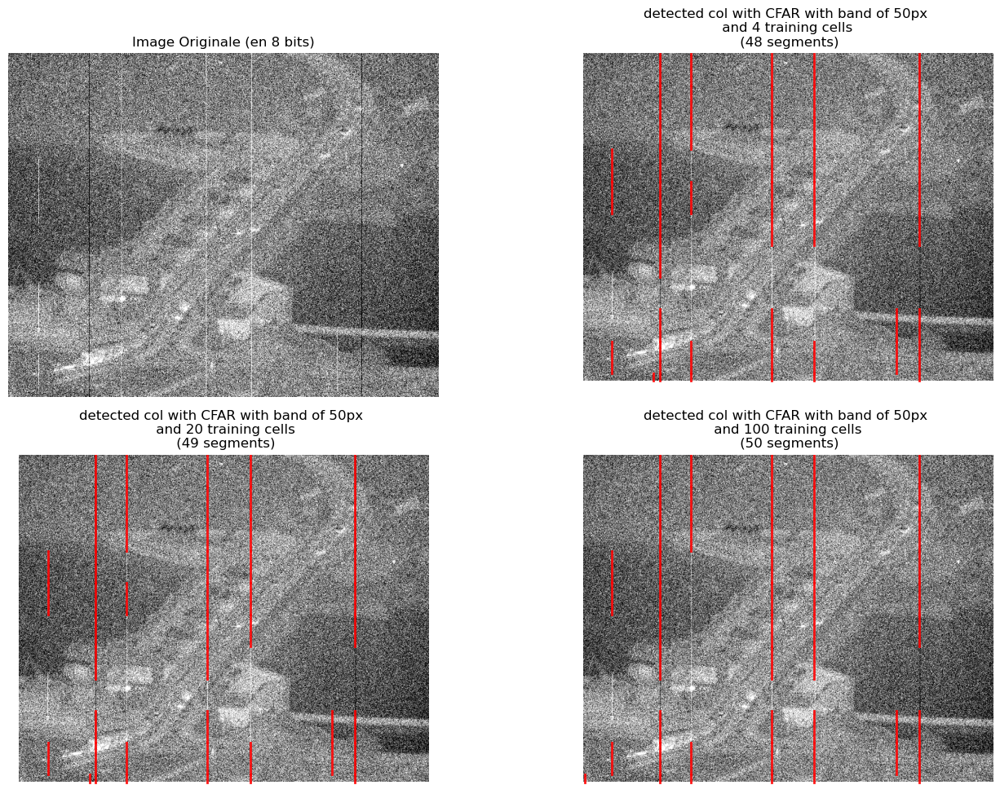

In [95]:
segments_cfar_band_train4 = detecter_cfar_par_bandes(image_def3, hauteur_bande=50, train_cells=4)
segments_cfar_band_train20 = detecter_cfar_par_bandes(image_def3, hauteur_bande=50, train_cells=20)
segments_cfar_band_train100 = detecter_cfar_par_bandes(image_def3, hauteur_bande=50, train_cells=100)
hauteur_test = 50

def compter_segments(dico):
    return sum(len(intervalles) for intervalles in dico.values())

###### VISUALISATION CFAR PAR BANDES ######
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
ax = ax.flatten()

# image originale 
ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale (en 8 bits)')
ax[0].set_axis_off()


# methode CFAR avec bandes

# methode CFAR avec bandes (4 cellules)
ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"detected col with CFAR with band of {hauteur_test}px \n and {4} training cells \n ({compter_segments(segments_cfar_band_train4)} segments)")   

for x, intervalles in segments_cfar_band_train4.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[1].axis('off')


# methode CFAR avec bandes (20 cellules)
ax[2].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[2].set_title(f"detected col with CFAR with band of {hauteur_test}px \n and {20} training cells\n ({compter_segments(segments_cfar_band_train20)} segments)")   

for x, intervalles in segments_cfar_band_train20.items():
    for y_start, y_end in intervalles:
        ax[2].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[2].axis('off')


# methode CFAR avec bandes (100 cellules)
ax[3].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[3].set_title(f"detected col with CFAR with band of {hauteur_test}px \n and {100} training cells \n ({compter_segments(segments_cfar_band_train100)} segments)")   

for x, intervalles in segments_cfar_band_train100.items():
    for y_start, y_end in intervalles:
        ax[3].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[3].axis('off')


plt.tight_layout() 
plt.show()

#### Comment 
Making the number of train cells vary doesn't seem to impact the detection that much. 

#### Varying Band width parameters values 

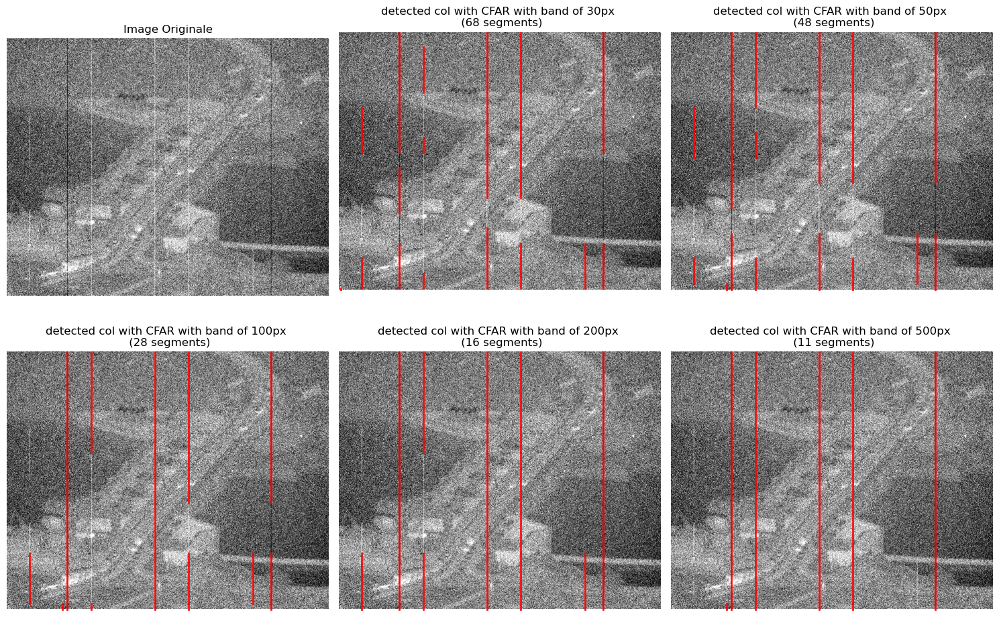

In [98]:
# Teste avec diff tailles de bandes 
segments_cfar_band_30 = detecter_cfar_par_bandes(image_def3, hauteur_bande=30)
segments_cfar_band_50 = detecter_cfar_par_bandes(image_def3, hauteur_bande=50)
segments_cfar_band_100 = detecter_cfar_par_bandes(image_def3, hauteur_bande=100)
segments_cfar_band_200 = detecter_cfar_par_bandes(image_def3, hauteur_bande=200)
segments_cfar_band_500 = detecter_cfar_par_bandes(image_def3, hauteur_bande=500)

###### VISUALISATION CFAR PAR BANDES ######
fig, ax = plt.subplots(2, 3, figsize=(15, 10))
ax = ax.flatten()

# image originale 
ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale')
ax[0].set_axis_off()

def compter_segments(dico):
    return sum(len(intervalles) for intervalles in dico.values())


# CFAR avec bandes 30
ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"detected col with CFAR with band of 30px \n ({compter_segments(segments_cfar_band_30)} segments)")   
for x, intervalles in segments_cfar_band_30.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[1].axis('off')


# CFAR avec bandes 50
ax[2].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[2].set_title(f"detected col with CFAR with band of 50px \n ({compter_segments(segments_cfar_band_50)} segments)")   
for x, intervalles in segments_cfar_band_50.items():
    for y_start, y_end in intervalles:
        ax[2].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[2].axis('off')


# CFAR avec bandes 100
ax[3].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[3].set_title(f"detected col with CFAR with band of 100px \n ({compter_segments(segments_cfar_band_100)} segments)")   
for x, intervalles in segments_cfar_band_100.items():
    for y_start, y_end in intervalles:
        ax[3].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[3].axis('off')


# CFAR avec bandes 200
ax[4].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[4].set_title(f"detected col with CFAR with band of 200px \n ({compter_segments(segments_cfar_band_200)} segments)")   
for x, intervalles in segments_cfar_band_200.items():
    for y_start, y_end in intervalles:
        ax[4].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[4].axis('off')


# CFAR avec bandes 500
ax[5].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[5].set_title(f"detected col with CFAR with band of 500px \n ({compter_segments(segments_cfar_band_500)} segments)")   
for x, intervalles in segments_cfar_band_500.items():
    for y_start, y_end in intervalles:
        ax[5].plot([x, x], [y_start, y_end], color='red', linewidth=2.0, alpha=0.9) 
ax[5].axis('off')

plt.tight_layout() 
plt.show()

#### Comment 
We are facing an impossible trade-off : 
- a small band width is detecting defects, even on fragmented ones. But not detecting as perfectly the full columns ones. 
- a large band width is detecting really well the full columns defects, but missing the small ones 

## Test new idea in 2 steps : detect (global) + measure (local)
### Test Comparison with horizontal neighbors

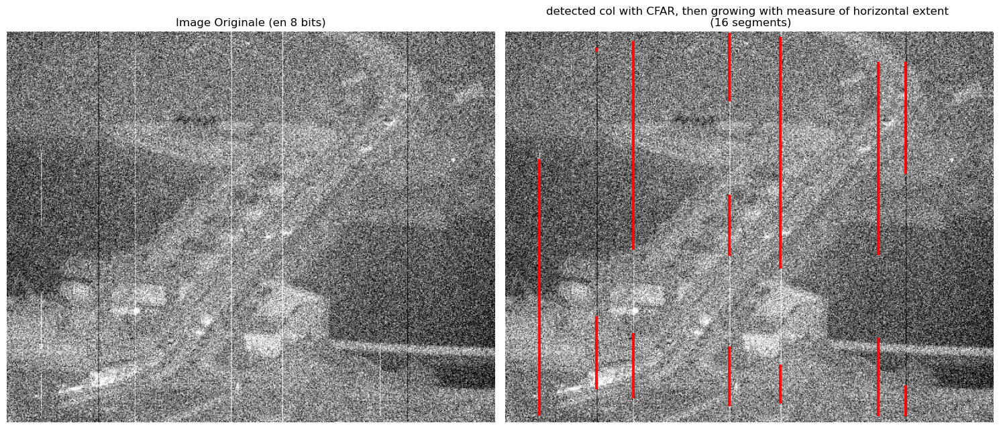

In [100]:
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt

def mesurer_hori(image_16bit, colonnes_suspectes, tolerance_trous=2):
    """
    fonction pour phase 2 -> Mesure précisément les segments [y_start, y_end] pour col id
    args
    - image_16bit : L'image brute (NumPy array)
    - colonnes_suspectes : Liste des X trouvés par la Phase 1 (ex: les clés d'un dictionnaire)
    - tolerance_trous : Nombre de pixels sains acceptés avant de "couper" un segment en deux.
    """
    height, width = image_16bit.shape
    
    # 1. Utilisation du nouveau standard : le dictionnaire
    segments_finaux = defaultdict(list)

    for x in colonnes_suspectes:
        x = int(x) # Petite sécurité
        
        # Isoler col et ses voisines
        x_gauche = max(0, x - 1)
        x_droite = min(width - 1, x + 1)
        
        colonne_cible = image_16bit[:, x].astype(np.float32)
        voisine_gauche = image_16bit[:, x_gauche].astype(np.float32)
        voisine_droite = image_16bit[:, x_droite].astype(np.float32)
        
        # calculer moy des voisines
        paysage_attendu = (voisine_gauche + voisine_droite) / 2.0
        
        # Calculer erreur (contraste) pixel par pixel de haut en bas
        erreur_verticale = np.abs(colonne_cible - paysage_attendu)
        
        # def un seuil de détection local 
        # utilise la médiane de l'erreur pour ne pas être faussé par les pics du défaut
        mediane_erreur = np.median(erreur_verticale)
        ecart_type_erreur = np.std(erreur_verticale)
        
        # Si pixel s'écarte de la voisine de plus de 2 écarts-types -> il est défectueux
        seuil = mediane_erreur + 2.0 * ecart_type_erreur
        
        # trouver les Y défectueux
        pixels_defectueux_y = np.where(erreur_verticale > seuil)[0]
        
        # regrouper pixels indiv en Segments [y_start, y_end]
        if len(pixels_defectueux_y) > 0:
            y_start = pixels_defectueux_y[0]
            y_prev = y_start
            
            for y in pixels_defectueux_y[1:]:
                # Si pixels se suivent (ou ont petit trou def par tolérance)
                if y <= y_prev + tolerance_trous + 1:
                    y_prev = y
                else:
                    # Le trou est trop grand -> fin du segment actuel
                    # ajout au dictionnaire
                    segments_finaux[x].append((int(y_start), int(y_prev)))
                    y_start = y
                    y_prev = y
                    
            segments_finaux[x].append((int(y_start), int(y_prev)))

    # convertit le defaultdict en dict normal
    return dict(segments_finaux)



# extrait la liste des col 'x' détectées juste au dessus
colonnes_a_tester = list(segments_cfar_band_200.keys())

seg_hori = mesurer_hori(image_def3, colonnes_a_tester, tolerance_trous=100)

def compter_segments(dico):
    return sum(len(intervalles) for intervalles in dico.values())

##### VISUALISATION #####
fig, ax = plt.subplots(1, 2, figsize=(15, 10))

ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale (en 8 bits)')
ax[0].set_axis_off()


ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"detected col with CFAR, then growing with measure of horizontal extent \n ({compter_segments(seg_hori)} segments)")   


for x, intervalles in seg_hori.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9) 

ax[1].axis('off')

plt.tight_layout()
plt.show()

#### comment 
The idea seems to work, but the extension of the defects doesn't work. 

### Test with vertical comparison 

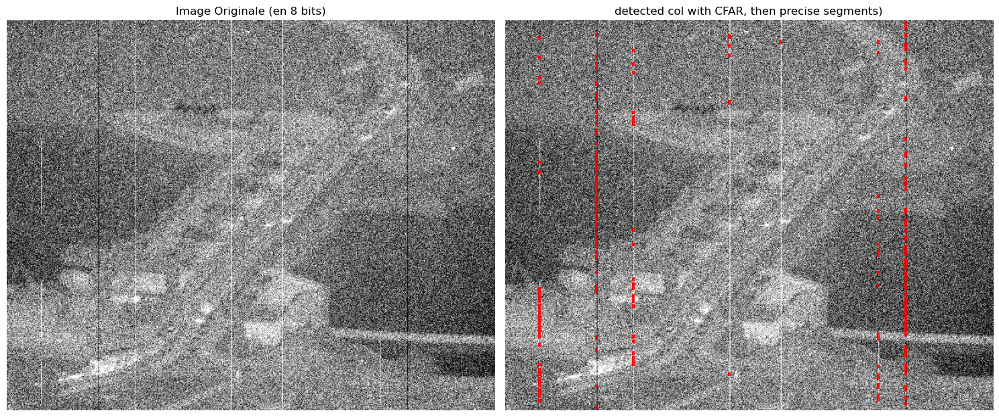

In [103]:
def mesurer_verti(image_16bit, colonnes_suspectes, coef_tolerance=2):
    """
    Mesure la taille des défauts en cherchant les sauts d'intensité verticaux.
    """
    segments_finaux = defaultdict(list) 
    for x in colonnes_suspectes:
        # extrait QUE colonne X 
        colonne = image_16bit[:, x].astype(np.float32)
        
        # def paysage normal de cette colonne
        mediane_colonne = np.median(colonne)
        ecart_type_colonne = np.std(colonne)
        
        # trouver les graines (seeds) (pixels anormaux)
        # tolérance basée sur le bruit de la colonne elle-même
        tolerance = coef_tolerance * ecart_type_colonne
        pixels_suspects_y = np.where(np.abs(colonne - mediane_colonne) > tolerance)[0]
        
        # Regroupement par "similitude d'intensité" 
        if len(pixels_suspects_y) > 0:
            y_start = pixels_suspects_y[0]
            y_prev = y_start
            
            for y in pixels_suspects_y[1:]:
                # calcule saut d'intensité avec le pixel suspect précédent
                saut_intensite = np.abs(colonne[y] - colonne[y_prev])
                
                # While intensité similaire (saut_intensite < tolerance) 
                # ET que sont physiquement proches (y <= y_prev + 2)
                if (y <= y_prev + 2) and (saut_intensite < tolerance):
                    y_prev = y  # prolonge le défaut
                else:
                    # BOUM ! On a détecté un changement fort d'intensité ou un grand trou -> fin du defaut
                    segments_finaux[x].append((int(y_start), int(y_prev)))
                    
                    # démarre nouv potentiel segment
                    y_start = y
                    y_prev = y
            
                    
            segments_finaux[x].append((int(y_start), int(y_prev)))
                    
    return segments_finaux

colonnes_a_tester = list(segments_cfar_band_200.keys())

segments_verti = mesurer_verti(image_def3, colonnes_a_tester, coef_tolerance=0.02)

###### VISUALISATION #####
fig, ax = plt.subplots(1, 2, figsize=(15, 10))

ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale (en 8 bits)')
ax[0].set_axis_off()


ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"detected col with CFAR, then precise segments)")   
for x, intervalles in segments_verti.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9) 
        
ax[1].axis('off')


plt.tight_layout()
plt.show()


### Comment 
doesn't work that much either 

### CFAR + Region Growing 

In [109]:
from collections import defaultdict

def fusionner_segments_verticaux(segments_dict):
    """
    si deux petits défauts s'étendent et finissent 
    par se rentrer dedans, on les fusionne en un seul grand défaut.
    Prend et renvoie un dictionnaire {x: [(y_start, y_end), ...]}
    """
    if not segments_dict: return {}
    
    segments_fusion = defaultdict(list)
    
    # itère directement sur notre dictionnaire propre
    for x, intervalles in segments_dict.items():
        if not intervalles:
            continue
            
        # Trier de haut en bas (en se basant sur y_start)
        intervalles_tries = sorted(intervalles, key=lambda v: v[0])
        
        # convertit le premier intervalle en liste [y_start, y_end] pour pouvoir le modifier
        fusion = [list(intervalles_tries[0])]
        
        for courant in intervalles_tries[1:]:
            dernier = fusion[-1]
            
            # Si les segments se chevauchent ou se touchent
            if courant[0] <= dernier[1] + 1:
                # On étire le segment précédent jusqu'à la fin du segment courant
                dernier[1] = max(dernier[1], courant[1])
            else:
                # Sinon on ajoute le nouveau segment
                fusion.append(list(courant))
                
        # reconvertit en tuples (y_start, y_end) natifs pour garder notre standard format
        segments_fusion[int(x)] = [(int(y_s), int(y_e)) for y_s, y_e in fusion]
            
    return dict(segments_fusion)


def prolonger_defauts_jusqua_rupture(image_16bit, segments_initiaux, multiplicateur_rupture=3.5):
    """
    Prend les petits défauts (dictionnaire) détectés par CFAR_band et les prolonge 
    jusqu'à rencontrer un bord net dans l'image. Puis fusionne tous les segments qui se superposent.
    """
    height, width = image_16bit.shape
    segments_etendus = defaultdict(list)

    for x, intervalles in segments_initiaux.items():
        x = int(x)
        colonne = image_16bit[:, x].astype(np.float32)
        
        sauts_verticaux = np.abs(np.diff(colonne)) 
        bruit_normal = np.median(sauts_verticaux) 
        ecart_sauts = np.std(sauts_verticaux)
        seuil_rupture = bruit_normal + (multiplicateur_rupture * ecart_sauts) 

        for y_start, y_end in intervalles:
            
            # Prolonger vers le HAUT 
            while y_start > 0: 
                saut_haut = np.abs(colonne[y_start] - colonne[y_start - 1]) 
                if saut_haut < seuil_rupture:
                    y_start -= 1 
                else:
                    break

            # Prolonger vers le BAS 
            while y_end < (height - 1): 
                saut_bas = np.abs(colonne[y_end] - colonne[y_end + 1]) 
                if saut_bas < seuil_rupture:
                    y_end += 1 
                else:
                    break 
                    
            segments_etendus[x].append((int(y_start), int(y_end)))

    # On passe le dictionnaire à la fonction de fusion
    return fusionner_segments_verticaux(segments_etendus)


# On récupère les défauts détectés par le CFAR avec une bande 30 
graines_bandes_30 = detecter_cfar_par_bandes(image_def3, hauteur_bande=30) 

# On étire ces graines aux limites réelles du défaut
segments_finaux_parfaits_30 = prolonger_defauts_jusqua_rupture(
    image_def3, 
    graines_bandes_30, 
    multiplicateur_rupture=3.2
)

def compter_segments(dico):
    return sum(len(intervalles) for intervalles in dico.values())

# print(f"Segments finaux mesurés : {segments_finaux_parfaits_30}")
# print(f"Nombre de segments finaux : {compter_segments(segments_finaux_parfaits_30)}")

#### Reflexion on the function 
Si on calcul les sauts "normaux" et notre seuil en se basant sur la médiane, on risque de mal gérer les petits morceaux de fragmented col. -> idée à tester de baser son seuil sur la médiane ou la moyenne des pixel_actuel +- n ? 
-> à mais non enfaite parce que c'est pas ue médiane sur les valeurs des intensités, mais la médiane des différences entre 2 pixels qui se suivent. Donc dés que la diff est plus élevée que celle d'habitude (que ce soit sur les bons pixels de l'image, ou ceux du défaut)

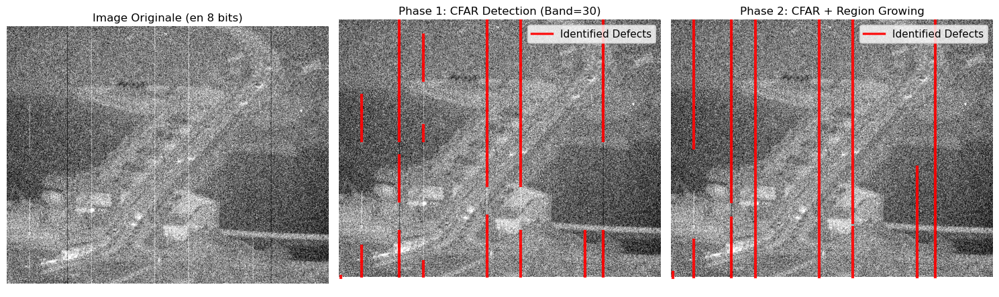

In [170]:

from matplotlib.lines import Line2D

graines_bandes_30 = detecter_cfar_par_bandes(image_def3, hauteur_bande=30) # on recup les défauts détectés par le CFAR avec une bande 30 
# utilisation nouv logique pour étirer ces graines aux limites réelles du défaut
segments_finaux_parfaits_30 = prolonger_defauts_jusqua_rupture(
    image_def3, 
    graines_bandes_30, 
    multiplicateur_rupture=3.2 # Augmente ça que défaut s'étire + (que la "grosse" marche soit plus difficile à atteindre) 
                                # -> ATTENTION risque FA !!!
)

####### VISUALISATION ######

fig, ax = plt.subplots(1, 3, figsize=(15, 10))

custom_legend_line = [Line2D([0], [0], color='red', lw=2.5, alpha=0.9)]

ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale (en 8 bits)')
ax[0].set_axis_off()


ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"Phase 1: CFAR Detection (Band=30)")   
for x, intervalles in graines_bandes_30.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9)

ax[1].axis('off')
ax[1].legend(custom_legend_line, ['Identified Defects'], loc='upper right', fontsize=11, frameon=True, facecolor='white', framealpha=0.8)


ax[2].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[2].set_title(f"Phase 2: CFAR + Region Growing")   
for x, intervalles in segments_finaux_parfaits_30.items():
    for y_start, y_end in intervalles:
        ax[2].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9)
ax[2].axis('off')
ax[2].legend(custom_legend_line, ['Identified Defects'], loc='upper right', fontsize=11, frameon=True, facecolor='white', framealpha=0.8)



plt.tight_layout()
plt.show()

#### Comment 
It is working quite well !!

### CFAR_band + RG
to see if it is detecting more seeds of defects (ATTENTION risk of False Alarm)

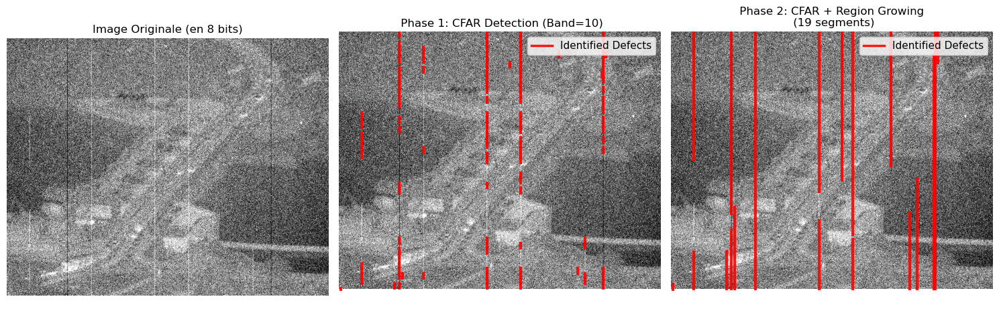

In [172]:
graines_bandes_10 = detecter_cfar_par_bandes(image_def3, hauteur_bande=10) 

segments_finaux_parfaits_10 = prolonger_defauts_jusqua_rupture(
    image_def3, 
    graines_bandes_10, 
    multiplicateur_rupture=3.2 # Augmente ça pour que le défaut s'étire + 
                                # -> ATTENTION risque FA !!!
)

# Fonction utile pour le titre
def compter_segments(dico):
    return sum(len(intervalles) for intervalles in dico.values())


####### VISUALISATION ######

fig, ax = plt.subplots(1, 3, figsize=(15, 10))

custom_legend_line = [Line2D([0], [0], color='red', lw=2.5, alpha=0.9)]

ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Image Originale (en 8 bits)')
ax[0].set_axis_off()


ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f" Phase 1: CFAR Detection (Band=10)")   

for x, intervalles in graines_bandes_10.items():
    for y_start, y_end in intervalles:
        ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9) 
        
ax[1].axis('off')
ax[1].legend(custom_legend_line, ['Identified Defects'], loc='upper right', fontsize=11, frameon=True, facecolor='white', framealpha=0.8)


ax[2].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[2].set_title(f" Phase 2: CFAR + Region Growing \n ({compter_segments(segments_finaux_parfaits_10)} segments)")   

for x, intervalles in segments_finaux_parfaits_10.items():
    for y_start, y_end in intervalles:
        ax[2].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9) 
        
ax[2].axis('off')
ax[2].legend(custom_legend_line, ['Identified Defects'], loc='upper right', fontsize=11, frameon=True, facecolor='white', framealpha=0.8)


plt.tight_layout()
plt.show()

#### Comment 
YEAHHH It is detecting more defects indeed ! BUT !!! We need to check with the JSON to see if they are not much FA.

And the full columns are still detected as fragmented so we maybe need to tune the threshold to overcome this.

### TEST CFAR_band with alpha from the article 

In [121]:

def detecter_cfar_par_bandes_a(image, hauteur_bande=60, train_cells=4, guard_cells=2, use_alpha=False, p_fa=0.05):
    """
    Découpe l'image en bandes horizontales et applique le CFAR sur chaque bande
    pour détecter les fragments de défaut des colonnes.
    
    Paramètres additionnels:
    - use_alpha (bool) : Si False, utilise la tolérance classique (3 * std).
                         Si True, calcule le multiplicateur Alpha avec le p_fa.
    - p_fa (float) : Probabilité de fausse alarme (utilisée uniquement si use_alpha=True).
    
    Retourne : 
    - Un dictionnaire de la forme {x: [(y1_start, y1_end), (y2_start, y2_end), ...]}
    """
    height, width = image.shape
    
    segments_trouves = {}
    
    num_train_side = train_cells 
    num_guard_side = guard_cells  
    taille_fenetre = (num_train_side * 2) + (num_guard_side * 2) + 1 
    
    noyau = np.zeros(taille_fenetre)
    noyau[:num_train_side] = 1.0  
    noyau[-num_train_side:] = 1.0 
    
    train_len = num_train_side * 2
    noyau = noyau / train_len
    
    if use_alpha: # alpha de l'article
        alpha = train_len * (p_fa**(-1/train_len) - 1)

    for y_start in range(0, height, hauteur_bande):
        y_end = min(y_start + hauteur_bande, height)
        
        bande = image[y_start:y_end, :]
        
        projection_bande = np.median(bande, axis=0)
        
        bruit_de_fond_local = convolve1d(projection_bande, noyau, mode='nearest')
        ecart_type_bande = np.std(projection_bande)
        
        if not use_alpha:
            tolerance = 3 * ecart_type_bande  
        else:
            tolerance = alpha * ecart_type_bande
            
        seuil_haut = bruit_de_fond_local + tolerance
        seuil_bas = bruit_de_fond_local - tolerance
        
        colonnes_detectees = np.where(
            (projection_bande > seuil_haut) | 
            (projection_bande < seuil_bas)
        )[0]
        
        for x in colonnes_detectees:
            # On convertit en int() Python standard pour éviter les problèmes 
            # de compatibilité si on exporte en JSON plus tard (numpy.int64 passe mal)
            col_x = int(x) 
            
            # Si la colonne n'existe pas encore dans le dico, on la crée avec une liste vide
            if col_x not in segments_trouves:
                segments_trouves[col_x] = []
                
            # On ajoute le tuple (y_start, y_end) à la liste de cette colonne
            segments_trouves[col_x].append((y_start, y_end))

    return segments_trouves

hauteur_test = 50

# Avec ta méthode classique
segments_sans_alpha = detecter_cfar_par_bandes_a(image_def3, hauteur_bande=hauteur_test, use_alpha=False)
print(f"Méthode classique (Tolérance 3) : {len(segments_sans_alpha)} colonnes suspectes trouvées")
print(f"Dictionnaire : {segments_sans_alpha}\n")

# Avec l'approche mathématique
segments_avec_alpha = detecter_cfar_par_bandes_a(image_def3, hauteur_bande=hauteur_test, use_alpha=True, p_fa=0.01)
print(f"Méthode mathématique (Alpha calculé via P_fa) : {len(segments_avec_alpha)} colonnes suspectes trouvées")
print(f"Dictionnaire : {segments_avec_alpha}")

Méthode classique (Tolérance 3) : 8 colonnes suspectes trouvées
Dictionnaire : {120: [(0, 50), (50, 100), (100, 150), (150, 200), (200, 250), (250, 300), (300, 350), (400, 450), (450, 500), (500, 512)], 168: [(0, 50), (50, 100), (100, 150), (200, 250), (450, 500), (500, 512)], 294: [(0, 50), (50, 100), (100, 150), (150, 200), (200, 250), (250, 300), (400, 450), (450, 500), (500, 512)], 361: [(0, 50), (50, 100), (100, 150), (150, 200), (200, 250), (250, 300), (450, 500), (500, 512)], 525: [(0, 50), (50, 100), (100, 150), (150, 200), (200, 250), (250, 300), (400, 450), (450, 500), (500, 512)], 45: [(150, 200), (200, 250), (450, 500)], 489: [(400, 450), (450, 500)], 110: [(500, 512)]}

Méthode mathématique (Alpha calculé via P_fa) : 3 colonnes suspectes trouvées
Dictionnaire : {294: [(0, 50), (50, 100)], 361: [(0, 50), (50, 100)], 525: [(0, 50)]}


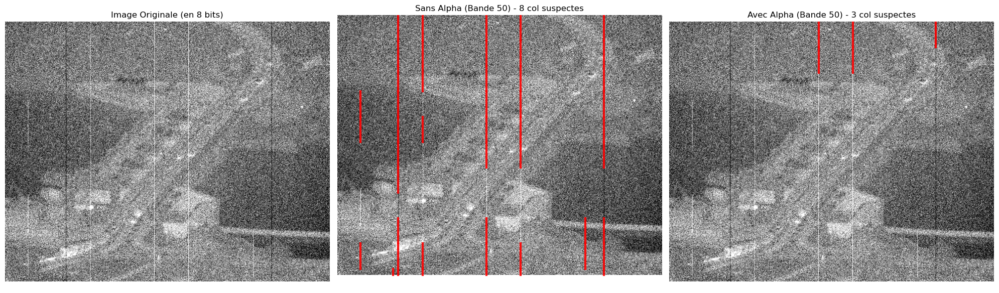

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

ax[0].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[1].set_title(f"Sans Alpha (Bande 50) - {len(segments_sans_alpha)} col suspectes")   

for x, liste_intervalles in segments_sans_alpha.items():
    for (y_start, y_end) in liste_intervalles:
        
        if (y_end - y_start) < 5:
            ax[1].plot([x, x], [y_start, y_end], color='red', marker='s', markersize=4, zorder=10)
        else:
            ax[1].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9, zorder=10) 

ax[1].axis('off')

ax[2].imshow(convert_to_8_img(image_def3), cmap='gray')
ax[2].set_title(f"Avec Alpha (Bande 50) - {len(segments_avec_alpha)} col suspectes")   

for x, liste_intervalles in segments_avec_alpha.items():
    for (y_start, y_end) in liste_intervalles:
        
        if (y_end - y_start) < 5:
            ax[2].plot([x, x], [y_start, y_end], color='red', marker='s', markersize=4, zorder=10)
        else:
            ax[2].plot([x, x], [y_start, y_end], color='red', linewidth=3.0, alpha=0.9, zorder=10) 

ax[2].axis('off')

plt.tight_layout()
plt.show()

### Comment 
We clearly see the method with the calculated doesn't work. This can be explained by the fact this alpha is made for radar image and therefore not suitable for IR

## Detection V0 (CFAR_band avec RG)

In [133]:
def cfar_band_rg(image, hauteur_bande=50, train_cells=4, guard_cells=2, multiplicateur_rupture=3.5):
    """
    détection et mesure des colonnes défectueuses (entières et fragmentées).
    
    1. Découpe l'image en bandes et applique un filtre CA-CFAR pour trouver des "graines" de défauts.
    2. Prolonge ces graines vers le haut et le bas (Region Growing) jusqu'à une rupture d'intensité.
    3. Fusionne les segments qui se chevauchent et formate le résultat final.
    
    Args:
        image (numpy.ndarray): L'image 16-bits en entrée.
        hauteur_bande (int): Taille de la bande horizontale pour le CFAR (défaut: 50).
        train_cells (int): Nombre de cellules d'entraînement de chaque côté (défaut: 4).
        guard_cells (int): Nombre de cellules de garde de chaque côté (défaut: 2).
        multiplicateur_rupture (float): Tolérance pour le seuil de rupture lors de la croissance (défaut: 3.5).
        
    Returns:
        dict: Dictionnaire formaté {x: [(y1_start, y1_end), (y2_start, y2_end), ...]} 

    """
    height, width = image.shape

    
    segments_initiaux = []
    
    num_train_side = train_cells 
    num_guard_side = guard_cells  
    taille_fenetre = (num_train_side * 2) + (num_guard_side * 2) + 1 
    noyau = np.zeros(taille_fenetre)
    noyau[:num_train_side] = 1.0  
    noyau[-num_train_side:] = 1.0 
    noyau = noyau / (num_train_side * 2)

    # parcourt l'img de haut en bas, en sautant de 'hauteur_bande' en 'hauteur_bande'
    for y_start in range(0, height, hauteur_bande):
        y_end = min(y_start + hauteur_bande, height) # min() pour ne pas déborder à la fin
        
        # extrait la sous-image (bande horizontale)
        bande = image[y_start:y_end, :]
        
        # calcule la projection médiane UNIQUEMENT sur cette bande
        projection_bande = np.median(bande, axis=0)
        
        # applique le CFAR
        bruit_de_fond_local = convolve1d(projection_bande, noyau, mode='nearest')
        
        # Tolérance locale pour cette bande spécifique
        ecart_type_bande = np.std(projection_bande)
        tolerance = 3 * ecart_type_bande  
        
        seuil_haut = bruit_de_fond_local + tolerance
        seuil_bas = bruit_de_fond_local - tolerance
        
        # Détection pour cette bande
        colonnes_detectees = np.where(
            (projection_bande > seuil_haut) | 
            (projection_bande < seuil_bas)
        )[0]
        
        # On enregistre les résultats sous forme de segments initiaux (graines)
        for x in colonnes_detectees:
            segments_initiaux.append([(x, y_start), (x, y_end)])


    segments_etendus = []

    for segment in segments_initiaux:
        # On force la conversion en entier natif python pour la suite
        x = int(segment[0][0])
        y_start = int(segment[0][1])
        y_end = int(segment[1][1])
        
        colonne = image[:, x].astype(np.float32) # pour chaque x, on prend tous les px de la col
        
        # Calculer ce qu'est un "saut normal" / et seuil sur cette colonne
        sauts_verticaux = np.abs(np.diff(colonne))  # regarde dériv abs (diff entre chaque pixel et suivant (de la col))

        bruit_normal = np.median(sauts_verticaux) # on calc les sauts normaux (sur le défaut, ou sur le vrai paysage de l'img) en prennant médiane de tous les sauts 
        ecart_sauts = np.std(sauts_verticaux)
        
        seuil_rupture = bruit_normal + (multiplicateur_rupture * ecart_sauts) # calc marche qu'on considère trop grande (fin du défaut)

        # Prolonger vers le HAUT (on remonte la colonne)
        while y_start > 0: # boucle tant qu'on a pas atteint le haut de l'image
            # Quelle est la taille de la marche pour monter sur le pixel du dessus ?
            saut_haut = np.abs(colonne[y_start] - colonne[y_start - 1]) # diff entre px et celui d'avnat 
            
            if saut_haut < seuil_rupture:
                # Intensité similaire : on est toujours dans le défaut
                y_start -= 1 # on continue de rémonter 
            else:
                # BOUM ! Rupture forte d'intensité, on a trouvé le bord supérieur.
                break

        # Prolonger vers le BAS (on descend la colonne)
        while y_end < (height - 1): # boucle tant qu'on a pas atteint le bas de l'image
            # Quelle est la taille de la marche pour descendre sur le pixel du dessous ?
            saut_bas = np.abs(colonne[y_end] - colonne[y_end + 1]) # diff entre px et celui d'après 
            
            if saut_bas < seuil_rupture:
                y_end += 1 # on continue de descendre 
            else:
                break # sinon saut trop gros, on a trouvé bord inf
                
        # On stocke les coordonnées étendues sous forme de liste simple pour la fusion
        segments_etendus.append([x, y_start, y_end])


    if not segments_etendus: 
        return {}
    
    # Grouper par colonne (x)
    dict_cols = {}
    for seg in segments_etendus:
        x, y_s, y_e = seg[0], seg[1], seg[2]
        if x not in dict_cols: 
            dict_cols[x] = []
        dict_cols[x].append([y_s, y_e])
        
    segments_fusion_dict = {}
    
    for x, intervalles in dict_cols.items():
        intervalles.sort(key=lambda v: v[0]) # Trier de haut en bas
        fusion = [intervalles[0]]
        
        for courant in intervalles[1:]:
            dernier = fusion[-1]
            # Si les segments se chevauchent ou se touchent
            if courant[0] <= dernier[1] + 1:
                dernier[1] = max(dernier[1], courant[1])
            else:
                fusion.append(courant)
                
        # On remplit le dictionnaire avec une liste de tuples (y_start, y_end)
        segments_fusion_dict[x] = [(y_s, y_e) for y_s, y_e in fusion]
            
    return segments_fusion_dict

resultats_finaux = cfar_band_rg(image_def3, hauteur_bande=30, multiplicateur_rupture=3)
# print(resultats_finaux)

### Test Local Thresholding (LT) with bands using different metrics

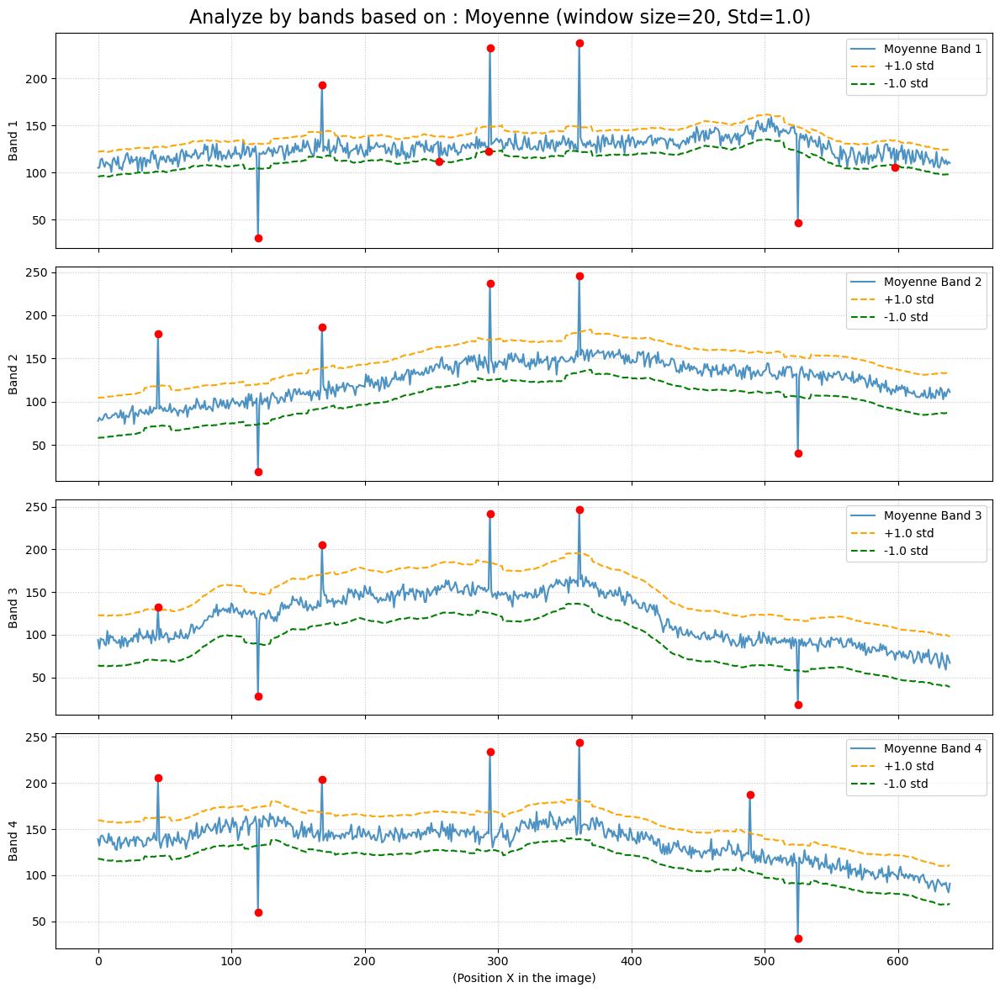

{120: [(0, 128), (128, 256), (256, 384), (384, 512)],
 168: [(0, 128), (128, 256), (256, 384), (384, 512)],
 256: [(0, 128)],
 293: [(0, 128)],
 294: [(0, 128), (128, 256), (256, 384), (384, 512)],
 361: [(0, 128), (128, 256), (256, 384), (384, 512)],
 525: [(0, 128), (128, 256), (256, 384), (384, 512)],
 598: [(0, 128)],
 45: [(128, 256), (256, 384), (384, 512)],
 489: [(384, 512)]}

In [148]:
from collections import defaultdict

def local_threshold_bandes(image, num_bandes=4, taille_fenetre=50, metrique='Moyenne', facteur_std=1.0, visual_graph=False):
    height, width = image.shape
    
    # On calcule la hauteur d'une bande selon le nb que y'en a 
    hauteur_bande = height // num_bandes
    
    predit_dict = defaultdict(list)
    
    debug_data = [] # pour grap

    for b in range(num_bandes):
        # def limites y de la bande
        y_start = b * hauteur_bande
        # Si c'est la dernière bande, on va jusqu'au bout de l'image (pour pas rater de px à cause de l'arrondi)
        y_end = height if b == num_bandes - 1 else (b + 1) * hauteur_bande
        
        # Extrait bande
        bande = image[y_start:y_end, :]

        # Calcul métrique sur CETTE bande
        if metrique == 'Moyenne':
            metrique_ = np.mean(bande, axis=0)
            label = 'Moyenne'
        elif metrique == 'Mediane':
            metrique_ = np.median(bande, axis=0)
            label = 'Mediane'
        elif metrique == 'Variance':
            metrique_ = np.std(bande, axis=0)
            label = 'Variance'
        else: 
            print('Erreur de métrique')
            return {}

        # Lissage (Tendance locale)
        filtre = np.ones(taille_fenetre) / taille_fenetre
        tendance_locale = convolve1d(metrique_, filtre, mode='reflect')
        
        # Marge tolérance (ajustée avec facteur_std)
        marge_tolerance = np.std(metrique_) * facteur_std
        
        # Détection bilatérale
        defect_columns = np.where(np.abs(metrique_ - tendance_locale) > marge_tolerance)[0]

        # Enregistrement dans le dictionnaire
        for col in defect_columns:
            # On stocke les coordonnées (y_start, y_end) spécifiques à cette bande
            predit_dict[int(col)].append((y_start, y_end))
            
        if visual_graph:
            debug_data.append((b, metrique_, tendance_locale, marge_tolerance, defect_columns))

    if visual_graph:
        # On crée des sous-graphes pour chaque bande
        fig, axes = plt.subplots(num_bandes, 1, figsize=(12, 3 * num_bandes), sharex=True)
        if num_bandes == 1:
            axes = [axes] 
            
        fig.suptitle(f'Analyze by bands based on : {label} (window size={taille_fenetre}, Std={facteur_std})', fontsize=16)

        for ax, data in zip(axes, debug_data):
            b, met_, tend_, marge_, def_cols = data
            
            ax.plot(met_, label=f'{label} Band {b+1}', color='#1f77b4', linewidth=1.5, alpha=0.8)
            ax.plot(tend_ + marge_, color='orange', linestyle='--', linewidth=1.5, label=f'+{facteur_std} std')
            ax.plot(tend_ - marge_, color='green', linestyle='--', linewidth=1.5, label=f'-{facteur_std} std')
            ax.scatter(def_cols, met_[def_cols], color='red', zorder=5)
            
            ax.set_ylabel(f'Band {b+1}')
            ax.grid(True, linestyle=':', alpha=0.7)
            ax.legend(loc='upper right')
            
        axes[-1].set_xlabel('(Position X in the image)')
        plt.tight_layout()
        plt.show()

    return dict(predit_dict)

local_threshold_bandes(image_def3, num_bandes=4, taille_fenetre=20, metrique='Moyenne', facteur_std=1.0, visual_graph=True) 
# print(local_threshold_bandes(image_def3, num_bandes=4, taille_fenetre=50, metrique='Moyenne', facteur_std=1.0, visual_graph=False)) 

## Test our method performance 
### We get the true defects from the JSON files
(function of PE)

In [124]:
def load_json(file_path):
    """
    Loads a JSON file and returns its content.

    Args:
        file_path (str): The path to the JSON file.

    Returns:
        list/dict: The parsed JSON data.
    """
    with open(file_path, "r", encoding="utf-8") as file:
        data = json.load(file)
    
    return data

# =========================================================================================

def get_defect_coordinates(json_data, image_number):
    """
    Parses JSON data to extract defect coordinates for a specific image number.

    Args:
        json_data (list): The list of dictionaries loaded from the JSON file.
        image_number (str or int): The specific image number to look for in the JSON.

    Returns:
        dict: A dictionary where keys are x-coordinates (columns) and values 
              are dictionaries containing lists of 'start' and 'stop' y-coordinates.
    """
    defect_dict = {}
    
    for item in json_data:
        value = item.get('signal', {}).get(str(image_number))
        
        if value is not None:
            for x_coord in item.get('x_coord', []):
                
                defect_dict[x_coord] = {
                    'ycords': (list(zip(item.get('y_start', []),item.get('y_stop', [])))),
                    'type': item.get('name', [])
                }

    return defect_dict

In [ ]:
def load_images(folder='train',type='VGA',sequence='sequence_1', dyn='low dyn with columns 1', force_gray=False):
    """
    function that load a folder of images

    args : 
    folder : folder type
    type : type of the frame (HD, VGA, SXGA)
    sequence : sequence_1, sequence_2, sequence_3
    dyn : low dyn with columns 1, low dyn with columns 2, low dyn with columns 3
    force_gray : bool to load in gray (one array)

    return :
    list of the images of the folder
    """
    images = []

    chemin_recherche = os.path.join(folder, type, sequence, dyn, '*.png')

    fichiers_trouves = sorted(glob.glob(chemin_recherche))

    if force_gray == True:
        for image_path in fichiers_trouves:
            img = io.imread(image_path, as_gray=True)
            images.append(img)
    else:
        for image_path in fichiers_trouves:
            img = io.imread(image_path)
            images.append(img)
            
    return images

### Functions to evaluate by comparing our res to the gt to obtain a score 

In [140]:
def evaluate_detection(vrai_dict, predit_dict, printing = False):
    """
    Évalue la détection avec correspondance exacte (sans tolérance).
    Force la conversion des clés en entiers (int) pour éviter les erreurs de type string/int.
    Calcule et retourne la Précision, le Rappel et le F1-Score.
    """
    vrais_positifs = 0
    faux_negatifs = 0
    faux_positifs = 0
    
    colonnes_predites_int = {int(x) for x in predit_dict.keys()}
    colonnes_predites_utilisees = set()

    for x_vrai_raw, infos_vrai in vrai_dict.items():
        x_vrai = int(x_vrai_raw) 
        
        if x_vrai in colonnes_predites_int:
            vrais_positifs += 1
            colonnes_predites_utilisees.add(x_vrai)
        else:
            faux_negatifs += 1

    # verif FA (faux positifs)
    for x_pred in colonnes_predites_int:
        # Si la colonne prédite n'a pas matché avec une vraie colonne
        if x_pred not in colonnes_predites_utilisees:
            faux_positifs += 1

    # calc stats finales
    precision = vrais_positifs / (vrais_positifs + faux_positifs) if (vrais_positifs + faux_positifs) > 0 else 0
    rappel = vrais_positifs / (vrais_positifs + faux_negatifs) if (vrais_positifs + faux_negatifs) > 0 else 0
    
    # Calcul du F1-Score
    if (precision + rappel) > 0:
        f1_score = 2 * (precision * rappel) / (precision + rappel)
    else:
        f1_score = 0
    
    if printing:
        print("\n--- RÉSULTATS DE LA DÉTECTION (Correspondance exacte) ---")
        print(f"Vrais Positifs (Bien trouvés)  : {vrais_positifs}")
        print(f"Faux Négatifs (Oubliés)        : {faux_negatifs}")
        print(f"Faux Positifs (Fausses alarmes): {faux_positifs}")
        print(f"Précision (Fiabilité)          : {precision*100:.1f}%")
        print(f"Rappel (Taux de découverte)    : {rappel*100:.1f}%")
        print(f"F1-Score (Score global)        : {f1_score*100:.1f}%")

    return vrais_positifs, faux_positifs, faux_negatifs, f1_score

In [ ]:
def evaluate_sequence_detection(methode_detection=local_threshold, 
                                folder='train', img_type='VGA', sequence='sequence_1', dyn='low dyn with columns 1', update=False):
    """
    Évalue la détection sur toute une séquence d'images.
    dataset_name : Le nom du dataset (qui servira à trouver les images et le JSON)
    methode_detection : La fonction à utiliser pour prédire les défauts
    """

    chiffre = int(dyn.split()[-1])

    data = load_images(folder=folder, type=img_type, sequence=sequence, dyn=dyn, force_gray=False)
    json_name = f'{img_type}_{sequence}_config_{chiffre}'
    
    # recup les JSON 
    chemin_json = f'results/{json_name}.json'
    json_data = load_json(chemin_json)
    
    # Initialisation des compteurs GLOBAUX
    total_vp = 0 # true positive
    total_fp = 0 # false positive
    total_fn = 0 # false negative

    # Boucle sur chaque image
    for i in range(len(data)):
        vrai_dict = get_defect_coordinates(json_data, i) # on recup dico des vrais defauts gt
        predit_dict = methode_detection(data[i]) # on recup dico des défauts qu'on trouve avec notre methode
        vp, fp, fn, f1_image = evaluate_detection(vrai_dict, predit_dict) # on compare les 2 dicos 
                                                                        # possible d'afficher les res de la detection à chaque image (ATTENTION peut polluer le terminal si trop d'images)
                                                                        # en mettant printing = True 
        # On ajoute aux compteurs globaux
        total_vp += vp 
        total_fp += fp
        total_fn += fn

    # calc scores globaux de la seq
    precision_seq = total_vp / (total_vp + total_fp) if (total_vp + total_fp) > 0 else 0
    rappel_seq = total_vp / (total_vp + total_fn) if (total_vp + total_fn) > 0 else 0
    
    if (precision_seq + rappel_seq) > 0:
        f1_score_seq = 2 * (precision_seq * rappel_seq) / (precision_seq + rappel_seq)
    else:
        f1_score_seq = 0

    # Affichage des résultats
    if update is True : 
        print("\n" + "="*50)
        print(f"RÉSULTATS GLOBAUX - SÉQUENCE : type : {img_type} sequence : {sequence} dyn : {dyn}")
        print("="*50)
        print(f"Total Vrais Positifs (VP) : {total_vp}")
        print(f"Total Faux Négatifs (FN)  : {total_fn} (Oublis)")
        print(f"Total Faux Positifs (FP)  : {total_fp} (Fausses alarmes)")
        print("-" * 50)
        print(f"Précision de la séquence  = {precision_seq*100:.2f}%")
        print(f"Recall de la séquence     = {rappel_seq*100:.2f}%")
        print(f"F1_score de la séquence   = {f1_score_seq*100:.2f}%")
        print("="*50 + "\n")
    
    return precision_seq, rappel_seq, f1_score_seq

In [165]:
def evaluate_type_detection(methode_detection, 
                          folder='train', 
                          img_type='VGA', 
                          sequences=['sequence_1', 'sequence_2', 'sequence_3'], 
                          dyns=['low dyn with columns 1', 'low dyn with columns 2', 'low dyn with columns 3'], 
                          update=False):
    """
    Évalue la détection sur plusieurs séquences ET plusieurs types de défauts (dyns).
    Cumule les VP, FP, et FN sur l'ensemble avant de calculer le score final.
    """
    # Compteurs GLOBAUX
    total_vp = 0
    total_fp = 0
    total_fn = 0

    # Boucle sur les séquences
    for seq in sequences:
        
        # Boucle sur les dynamiques (diff types de colonnes défectueuses)
        for dyn in dyns:
            
            # Récup le num du défaut (ex: "3" pour "columns 3")
            chiffre = int(dyn.split()[-1])
            
            # Charger les images pour cette combinaison (séquence + dyn)
            data = load_images(folder=folder, type=img_type, sequence=seq, dyn=dyn, force_gray=False)
            
            # Charger le JSON correspondant
            json_name = f'{img_type}_{seq}_config_{chiffre}'
            chemin_json = f'results/{json_name}.json'
            
            try:
                json_data = load_json(chemin_json)
            except FileNotFoundError:
                print(f"Attention : Fichier {chemin_json} introuvable. Combinaison {seq} / {dyn} ignorée.")
                continue
                
            # Boucle sur chaque image de ce dossier spécifique
            for i in range(len(data)):
                vrai_dict = get_defect_coordinates(json_data, i)
                predit_dict = methode_detection(data[i])
                vp, fp, fn, _ = evaluate_detection(vrai_dict, predit_dict)
                
                total_vp += vp
                total_fp += fp
                total_fn += fn

    # Calcul des scores GLOBAUX finaux (sur toutes les images de tous les dossiers)
    precision_globale = total_vp / (total_vp + total_fp) if (total_vp + total_fp) > 0 else 0
    rappel_global = total_vp / (total_vp + total_fn) if (total_vp + total_fn) > 0 else 0
    
    if (precision_globale + rappel_global) > 0:
        f1_score_global = 2 * (precision_globale * rappel_global) / (precision_globale + rappel_global)
    else:
        f1_score_global = 0

    # Affichage res globaux
    if update is True: 
        print("\n" + "="*60)
        print(f"RÉSULTATS GLOBAUX - TYPE : {img_type}")
        print(f"Séquences : {sequences}")
        print(f"Dynamiques : {dyns}")
        print("="*60)
        print(f"Total Vrais Positifs (VP) : {total_vp}")
        print(f"Total Faux Négatifs (FN)  : {total_fn} (Oublis)")
        print(f"Total Faux Positifs (FP)  : {total_fp} (Fausses alarmes)")
        print("-" * 60)
        print(f"Précision globale         = {precision_globale*100:.2f}%")
        print(f"Recall global             = {rappel_global*100:.2f}%")
        print(f"F1_score global           = {f1_score_global*100:.2f}%")
        print("="*60 + "\n")
    
    return precision_globale, rappel_global, f1_score_global


In [166]:
evaluate_type_detection(methode_detection=local_threshold, 
                          folder='train', 
                          img_type='VGA', 
                          sequences=['sequence_1', 'sequence_2', 'sequence_3'], 
                          dyns=['low dyn with columns 1', 'low dyn with columns 2', 'low dyn with columns 3'], 
                          update=True)
evaluate_type_detection(methode_detection=cfar_band_rg, 
                          folder='train', 
                          img_type='VGA', 
                          sequences=['sequence_1', 'sequence_2', 'sequence_3'], 
                          dyns=['low dyn with columns 1', 'low dyn with columns 2', 'low dyn with columns 3'], 
                          update=True)


RÉSULTATS GLOBAUX - TYPE : VGA
Séquences : ['sequence_1', 'sequence_2', 'sequence_3']
Dynamiques : ['low dyn with columns 1', 'low dyn with columns 2', 'low dyn with columns 3']
Total Vrais Positifs (VP) : 18996
Total Faux Négatifs (FN)  : 5626 (Oublis)
Total Faux Positifs (FP)  : 61157 (Fausses alarmes)
------------------------------------------------------------
Précision globale         = 23.70%
Recall global             = 77.15%
F1_score global           = 36.26%


RÉSULTATS GLOBAUX - TYPE : VGA
Séquences : ['sequence_1', 'sequence_2', 'sequence_3']
Dynamiques : ['low dyn with columns 1', 'low dyn with columns 2', 'low dyn with columns 3']
Total Vrais Positifs (VP) : 16364
Total Faux Négatifs (FN)  : 8258 (Oublis)
Total Faux Positifs (FP)  : 37390 (Fausses alarmes)
------------------------------------------------------------
Précision globale         = 30.44%
Recall global             = 66.46%
F1_score global           = 41.76%



(0.3044238568292592, 0.6646088863617903, 0.4175768092273145)